## 1

In [1]:
import pandas as pd #importing the libraries

In [2]:
import geopandas as gpd

In [3]:
pd.set_option('display.max_columns', 50) #setting the display option

In [4]:
#creating the dataframe
testDF = pd.DataFrame({'lat': [40.4259, 41.8781, 39.0792], 'long': [-86.9081, -87.6298, -84.17704]})

In [5]:
#run to get the result
testDF

,lat,long
0,40.4259,-86.90810
1,41.8781,-87.62980
2,39.0792,-84.17704


In [6]:
#Defining the grometry & CRS
gdf = gpd.GeoDataFrame(testDF, geometry=gpd.points_from_xy(testDF.long, testDF.lat), crs="4326")

<Axes: >

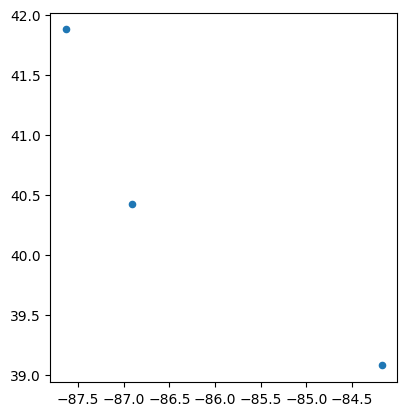

In [7]:
#creating the plot
gdf.plot(markersize = 20)

##  2

In [8]:
#loding the dataste with first 100 rows
myDF = pd.read_csv("/anvil/projects/tdm/data/craigslist/vehicles.csv", nrows=100)

In [9]:
myDF.head() #displaying the head

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,image_url,description,county,state,lat,long,posting_date
0,7222695916,https://prescott.craigslist.org/cto/d/prescott...,prescott,https://prescott.craigslist.org,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az,NaN,NaN,NaN
1,7218891961,https://fayar.craigslist.org/ctd/d/bentonville...,fayetteville,https://fayar.craigslist.org,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar,NaN,NaN,NaN
2,7221797935,https://keys.craigslist.org/cto/d/summerland-k...,florida keys,https://keys.craigslist.org,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl,NaN,NaN,NaN
3,7222270760,https://worcester.craigslist.org/cto/d/west-br...,worcester / central MA,https://worcester.craigslist.org,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma,NaN,NaN,NaN
4,7210384030,https://greensboro.craigslist.org/cto/d/trinit...,greensboro,https://greensboro.craigslist.org,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc,NaN,NaN,NaN


In [11]:
myDF.shape #displaying the dimension of it

(100, 26)

In [12]:
myDF.columns #checking the relevent columns

Index(['id', 'url', 'region', 'region_url', 'price', 'year', 'manufacturer',
       'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status',
       'transmission', 'VIN', 'drive', 'size', 'type', 'paint_color',
       'image_url', 'description', 'county', 'state', 'lat', 'long',
       'posting_date'],
      dtype='object')

In [13]:
#loding the full dataset with wanted columns
newDF = pd.read_csv("/anvil/projects/tdm/data/craigslist/vehicles.csv", usecols=["state", "long", "lat"])

In [14]:
#vreating the new dataframe to get desired result
indyDF = newDF[(newDF["state"] == "in") & (newDF["long"].notnull()) & (newDF["lat"].notnull())]

In [15]:
indyDF.shape #printing the dimesnsion of the above dataframe

(5634, 3)

## 3

In [ ]:
#creating the map with the Craiglist Data from Indiana

In [16]:
gdf = gpd.GeoDataFrame(indyDF, geometry=gpd.points_from_xy(indyDF.long, indyDF.lat), crs="4326")  # get the longitudes and latitudes from indyDF

In [17]:
gdf = gdf.assign(mycolors='orange')   # make the Craigslist data orange

In [18]:
gdf.explore(color = gdf['mycolors'])

## 4

In [19]:
#loding the New York taxi data with required columns
myDF = pd.read_csv("/anvil/projects/tdm/data/taxi/yellow/yellow_tripdata_2015-11.csv", usecols=['tpep_pickup_datetime','pickup_longitude','pickup_latitude'])

In [20]:
#imporitng datetime & defining the start and end time
from datetime import datetime 

paradestart = datetime.strptime('2015-11-26 09:00:00', "%Y-%m-%d %H:%M:%S")

paradeend = datetime.strptime('2015-11-26 12:00:00', "%Y-%m-%d %H:%M:%S")

In [21]:
myDF.head() #displaying the head of the data with first few rows

,tpep_pickup_datetime,pickup_longitude,pickup_latitude
0,2015-11-01 00:00:00,-73.983994,40.729500
1,2015-11-01 00:00:00,-73.984009,40.765289
2,2015-11-01 00:00:00,-74.002617,40.734058
3,2015-11-01 00:00:00,-73.987312,40.718712
4,2015-11-01 00:00:00,-73.949928,40.772190


In [22]:
myDF.shape #displaying the shape of the data 

(11312676, 3)

In [23]:
#converting it to  datetime format
mytimes = pd.to_datetime(myDF['tpep_pickup_datetime'])

In [24]:
#filtering data to include rides during parade time
finalDF = myDF[ (mytimes >= paradestart) & (mytimes <= paradeend)]

In [25]:
finalDF.shape #display the dhape of the sorted dataframe

(28710, 3)

##  5

In [26]:
#creating testDF based on above question
testDF = pd.DataFrame({'lat': finalDF['pickup_latitude'], 'long': finalDF['pickup_longitude']})

In [ ]:
#converting to GeodataFrame and assigning colors and plotting the map in the end.

In [27]:
gdf = gpd.GeoDataFrame(testDF, geometry=gpd.points_from_xy(testDF.long, testDF.lat), crs="4326")  # get the longitudes and latitudes from testDF
gdf = gdf.assign(mycolors='orange')   # make the taxi cab data orange
gdf.explore(color = gdf['mycolors'])   # plot the taxi cab data in explore mode